In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from tensorflow.python.keras.models import Sequential
import keras
from keras.layers import Dense, Conv2D, BatchNormalization, Activation
from keras.layers import MaxPooling2D, AveragePooling2D, Input, Flatten
from keras.models import Sequential, Model
from keras.regularizers import l2
from keras.optimizers import Adam
import cv2
########################################################
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.datasets import fashion_mnist as fm
########################################################
from tensorflow.python.keras.layers import Dense
from tensorflow.python.keras.models import load_model
from google.colab import drive
drive.mount('/content/drive')
import matplotlib.pyplot as plt
%matplotlib inline

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Defining constants
epochs = 5
batch_size = 512
data_augmentation = False
img_size = 32

num_classes = 10
num_filters = 64
num_blocks = 4
num_sub_blocks = 2

In [ ]:
(x_train, y_train), (x_test, y_test) = fm.load_data()

4423680/4422102 [==============================] - 0s 0us/step


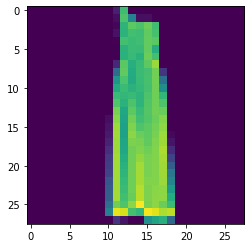

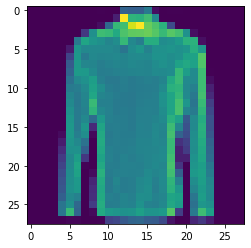

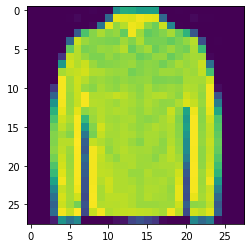

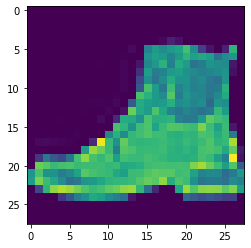

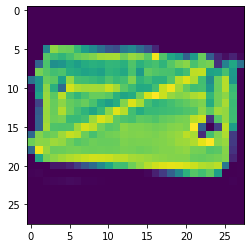

In [ ]:
from keras.preprocessing import image
import random

num = 5
all = x_train.shape[0]
i = random.randint(0, all - num)
for k in range(num):
  picture = x_train[i]
  plt.figure(k)
  imgplot = plt.imshow(picture.reshape((28,28)))
  i =i + 1

plt.show()

In [ ]:
from google.colab.patches import cv2_imshow
xx_train = []
xx_test = []
for img in x_train:
  xx_train.append(cv2.resize(cv2.cvtColor(img, cv2.COLOR_RGB2BGR), (32, 32)))
for img in x_test:
  xx_test.append(cv2.resize(cv2.cvtColor(img, cv2.COLOR_RGB2BGR), (32, 32)))
del x_train, x_test

x_train shape: (60000, 32, 32, 3)
60000 train samples
10000 test samples
Y_train shape: (60000,)


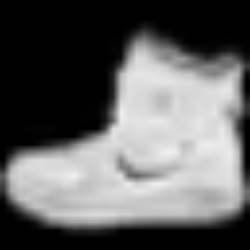

In [ ]:
# Normalize data.
x_train = np.array(xx_train)
x_test = np.array(xx_test)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')
print('Y_train shape:', y_train.shape)
cv2_imshow(cv2.resize(x_train[0], (250, 250)))

In [ ]:
#Converting labels to one-hot vectors
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

In [ ]:
print(f'y_train shape is {y_train.shape}')
print(f'y_test shape is {y_test.shape}')

y_train shape is (60000, 10)
y_test shape is (10000, 10)


In [ ]:
# Используем resnet50
from tensorflow.python.keras.layers import GlobalAveragePooling2D
base_model = ResNet50(input_shape=(img_size, img_size, 3),
                      weights='imagenet', # Использование весов предобученных на Imagenet
                      include_top=False) # Первый слой - НЕ полносвязный 
x = base_model.output
x = GlobalAveragePooling2D()(x) # Добавляем слой в модель
predictions = Dense(num_classes, activation='softmax')(x)
model = Model(base_model.input, predictions)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 38, 38, 3)    0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 16, 16, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1_conv[0][0]                 
____________________________________________________________________________________________

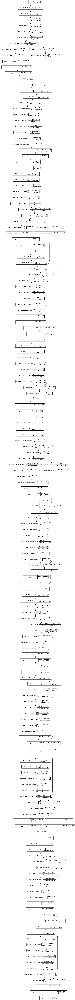

In [ ]:
from keras.utils import plot_model

# show_shapes указывает, надо ли рядом с слоями писать их размер
plot_model(model, to_file='/content/drive/My Drive/Colab Notebooks/Lr2/MyModel.png', show_shapes=True)  

cv2_imshow(cv2.imread('/content/drive/My Drive/Colab Notebooks/Lr2/MyModel.png'))

In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
        featurewise_center=False,
        samplewise_center=False, 
        featurewise_std_normalization=False,
        samplewise_std_normalization=False,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=False, 
        fill_mode='nearest',
        rescale=1./255
)

# train gen
train_generator = datagen
train_generator = datagen.flow(x_train, y_train, 
                               batch_size=batch_size)
# test gen
test_generator = ImageDataGenerator(rescale=1./255)
test_generator = test_generator.flow(x_test, y_test, 
                                     batch_size=batch_size)

In [ ]:
model.compile(optimizer='nadam',
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

In [ ]:
# Обучение c генераторами
history = model.fit(train_generator,
                    steps_per_epoch=train_generator.n // batch_size,
                    epochs=20,
                    validation_data=test_generator,
                    validation_steps=test_generator.n // batch_size,
                    verbose=1).history

Epoch 1/20
117/117 [==============================] - 33s 260ms/step - loss: 2.7415 - accuracy: 0.2044 - val_loss: 1.6399 - val_accuracy: 0.4279
Epoch 2/20
117/117 [==============================] - 30s 255ms/step - loss: 1.8530 - accuracy: 0.3218 - val_loss: 1.4401 - val_accuracy: 0.5035
Epoch 3/20
117/117 [==============================] - 30s 256ms/step - loss: 1.7349 - accuracy: 0.3711 - val_loss: 1.3548 - val_accuracy: 0.5499
Epoch 4/20
117/117 [==============================] - 30s 255ms/step - loss: 1.6668 - accuracy: 0.3968 - val_loss: 1.2972 - val_accuracy: 0.5663
Epoch 5/20
117/117 [==============================] - 30s 254ms/step - loss: 1.6182 - accuracy: 0.4157 - val_loss: 1.2536 - val_accuracy: 0.5761
Epoch 6/20
117/117 [==============================] - 30s 255ms/step - loss: 1.5868 - accuracy: 0.4276 - val_loss: 1.2227 - val_accuracy: 0.5887
Epoch 7/20
117/117 [==============================] - 30s 253ms/step - loss: 1.5573 - accuracy: 0.4397 - val_loss: 1.1969 - val_ac

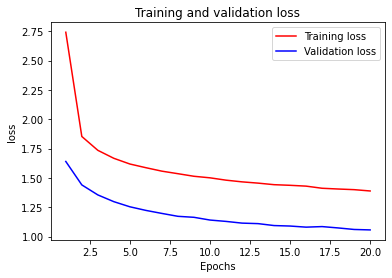

In [ ]:
mae = history['loss']
val_mae = history['val_loss']
epochs = range(1, len(history['loss']) + 1)
plt.plot(epochs, mae, 'r', label='Training loss')
plt.plot(epochs, val_mae, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

In [ ]:
class_names = ['Футболка / топ', "Шорты", "Свитер", "Платье",
              "Плащ", "Сандали", "Рубашка", "Кроссовок", "Сумка",
              "Ботинок"]

In [ ]:
predicted = model.predict(x_test)

Ботинок


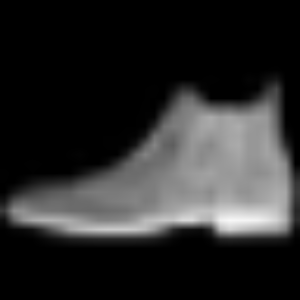

In [ ]:
print(class_names[np.argmax(predicted[0])])
cv2_imshow(cv2.resize(x_test[0], (300, 300)))

In [ ]:
# Используем resnet101
from tensorflow.python.keras.layers import GlobalAveragePooling2D
base_model = ResNet101(input_shape=(img_size, img_size, 3),
                      weights='imagenet', # Использование весов предобученных на Imagenet
                      include_top=False) # Первый слой - НЕ полносвязный 
x = base_model.output
x = GlobalAveragePooling2D()(x) # Добавляем слой в модель
predictions = Dense(num_classes, activation='softmax')(x)
model = Model(base_model.input, predictions)
model.summary()

171450368/171446536 [==============================] - 5s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 38, 38, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 16, 16, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1_conv[0][0]                 
___________________________

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.874276 to fit



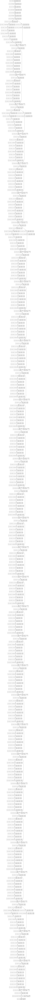

In [ ]:
from keras.utils import plot_model

# show_shapes указывает, надо ли рядом с слоями писать их размер
plot_model(model, to_file='/content/drive/My Drive/Colab Notebooks/Lr2/MyModel.png', show_shapes=True)  

cv2_imshow(cv2.imread('/content/drive/My Drive/Colab Notebooks/Lr2/MyModel.png'))

In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
model.compile(optimizer='nadam',
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

In [ ]:
# Обучение c генераторами
history = model.fit(train_generator,
                    steps_per_epoch=train_generator.n // batch_size,
                    epochs=20,
                    validation_data=test_generator,
                    validation_steps=test_generator.n // batch_size,
                    verbose=1).history

Epoch 1/20
117/117 [==============================] - 430s 4s/step - loss: 2.4495 - accuracy: 0.1453 - val_loss: 2.0127 - val_accuracy: 0.2782
Epoch 2/20
117/117 [==============================] - 422s 4s/step - loss: 2.1024 - accuracy: 0.2487 - val_loss: 1.8662 - val_accuracy: 0.3426
Epoch 3/20
117/117 [==============================] - 422s 4s/step - loss: 2.0271 - accuracy: 0.2726 - val_loss: 1.7762 - val_accuracy: 0.3847
Epoch 4/20
117/117 [==============================] - 423s 4s/step - loss: 1.9832 - accuracy: 0.2860 - val_loss: 1.7287 - val_accuracy: 0.3921
Epoch 5/20
117/117 [==============================] - 423s 4s/step - loss: 1.9581 - accuracy: 0.2942 - val_loss: 1.6776 - val_accuracy: 0.4159
Epoch 6/20
117/117 [==============================] - 423s 4s/step - loss: 1.9279 - accuracy: 0.3070 - val_loss: 1.6390 - val_accuracy: 0.4291
Epoch 7/20
117/117 [==============================] - 423s 4s/step - loss: 1.9094 - accuracy: 0.3122 - val_loss: 1.6054 - val_accuracy: 0.4568

In [ ]:
# добавление шума
def get_normal_noise(image):
  noise = np.random.normal(128, 20, (image.shape[0], image.shape[1]))
  return np.dstack((noise, noise, noise)).astype(np.uint8)

def get_uniform_noise(image):
  noise = np.random.uniform(0, 255, (image.shape[0], image.shape[1]))
  return np.dstack((noise, noise, noise)).astype(np.uint8)

def set_normal_noise(image):
  noise = get_normal_noise(image)
  noise_image = cv2.add(image.astype(np.float64), noise.astype(np.float64))
  cv2.normalize(noise_image, noise_image, 0, 255, cv2.NORM_MINMAX)
  return noise_image

def set_uniform_noise(image):
  noise = get_uniform_noise(image) 
  noise_image = cv2.add(image.astype(np.float64), noise.astype(np.float64))
  cv2.normalize(noise_image, noise_image, 0, 255, cv2.NORM_MINMAX)
  return noise_image

In [ ]:
gen_with_normal_noise = ImageDataGenerator(rescale=1./255, preprocessing_function=set_normal_noise).flow(x_train, y_train, batch_size=batch_size)
gen_with_uniform_noise = ImageDataGenerator(rescale=1./255, preprocessing_function=set_uniform_noise).flow(x_train, y_train, batch_size=batch_size)

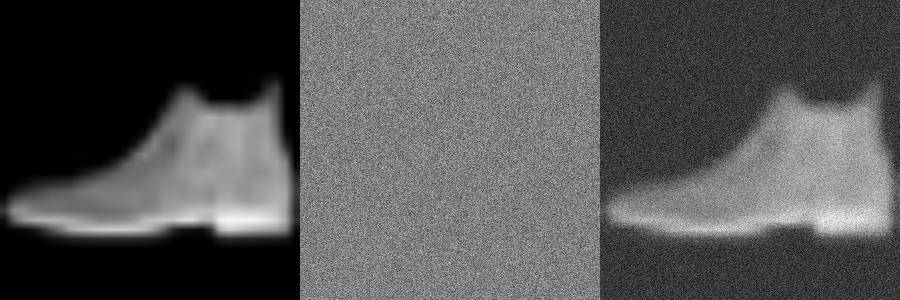

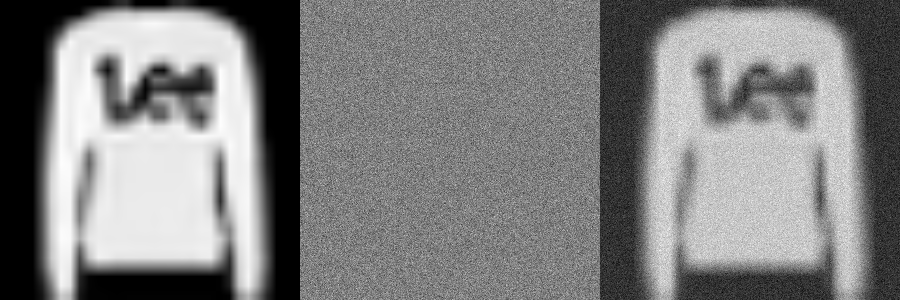

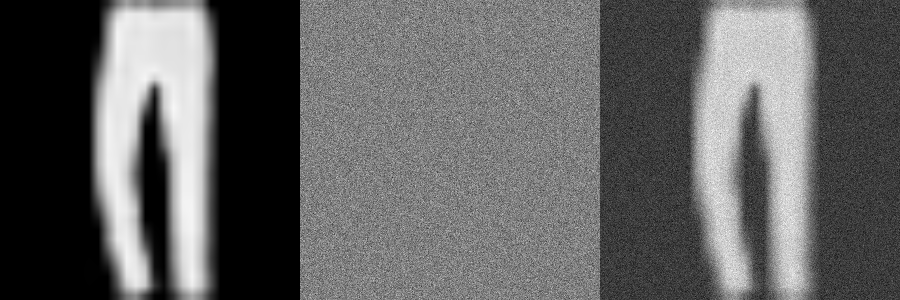

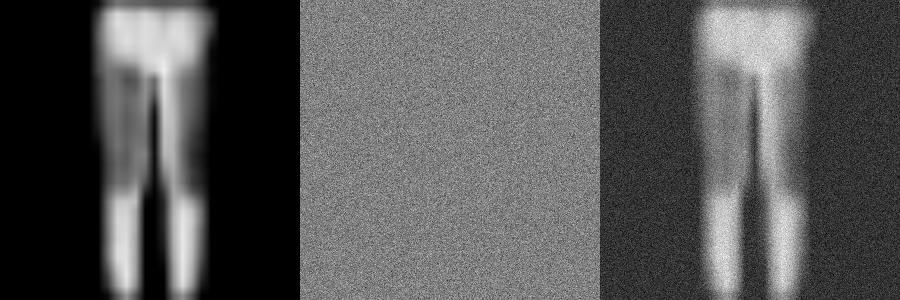

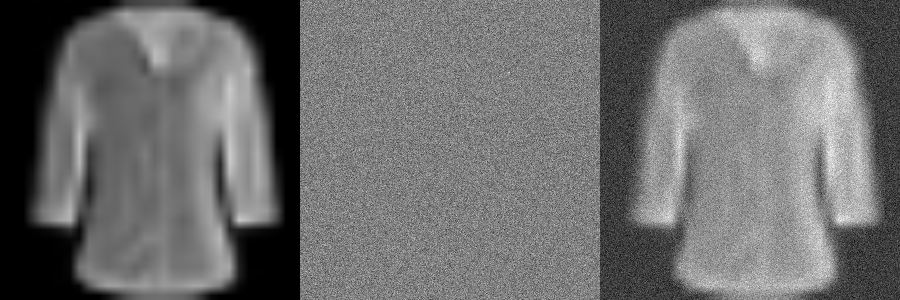

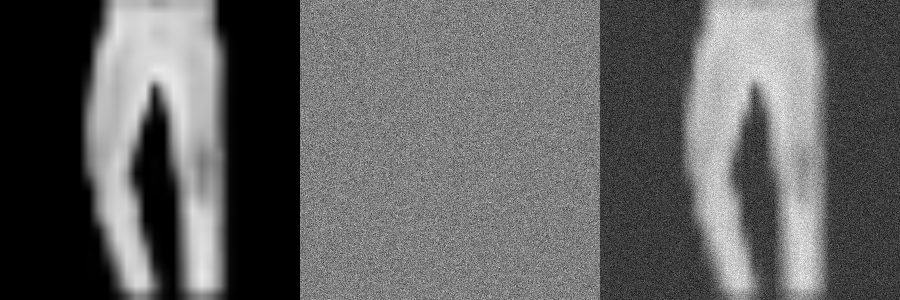

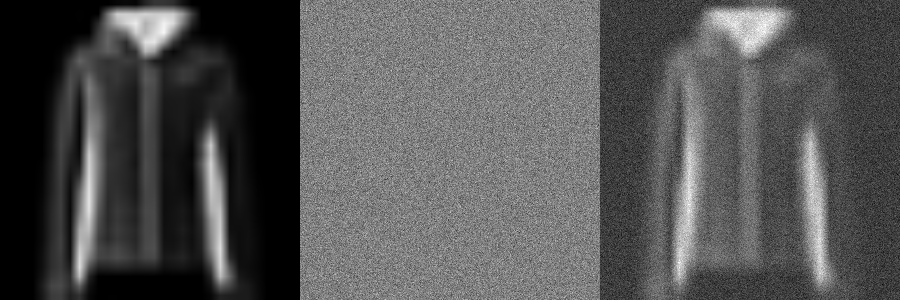

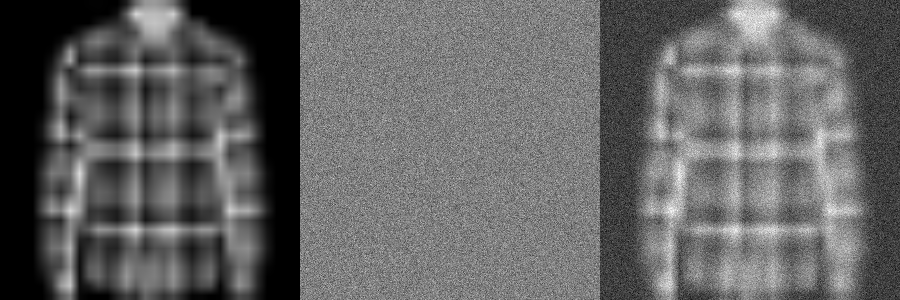

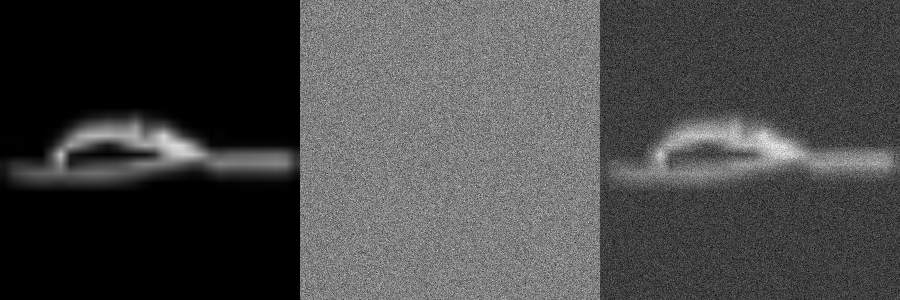

In [ ]:
# Добавление нормального шума
for i in range(9):
  cv2_imshow(np.concatenate((
             cv2.resize(x_test[i], (300, 300)), 
             get_normal_noise(cv2.resize(x_test[i], (300, 300))), 
             set_normal_noise(cv2.resize(x_test[i], (300, 300)))), axis=1)) 

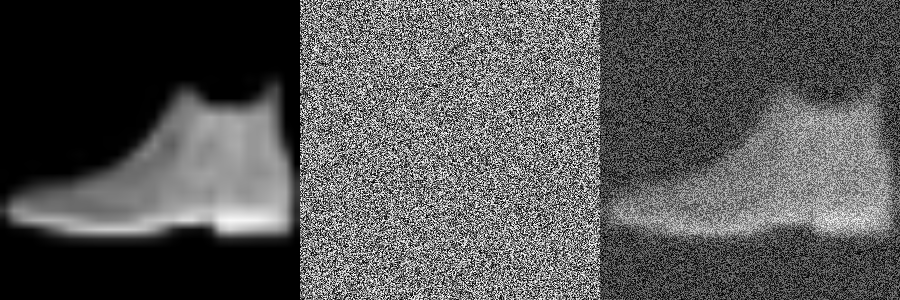

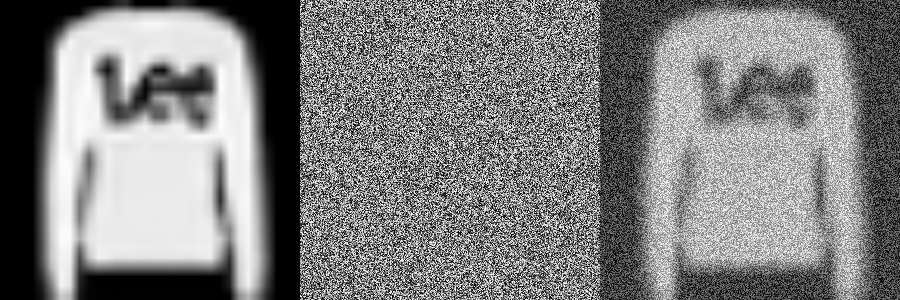

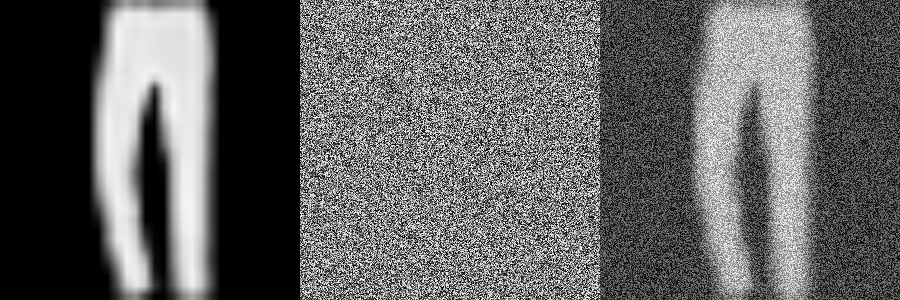

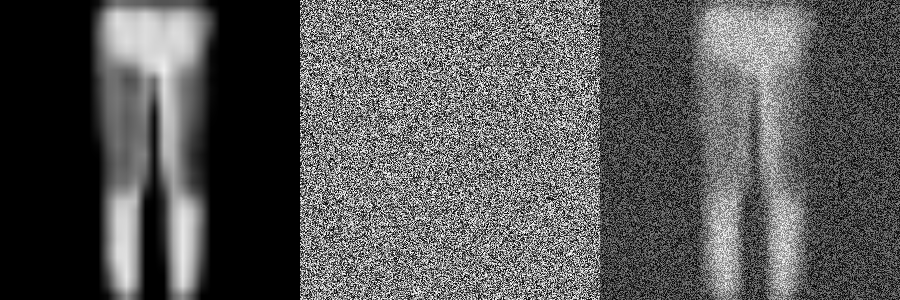

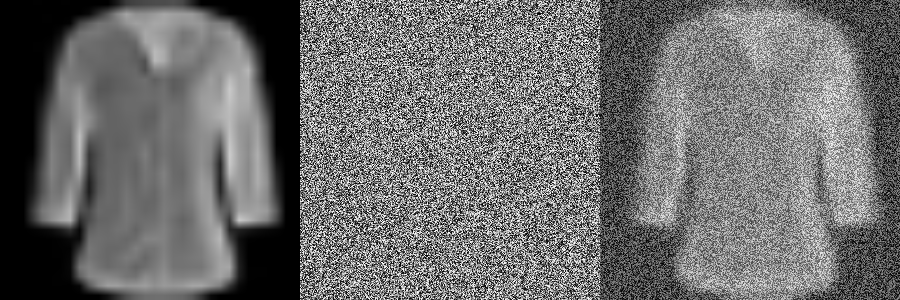

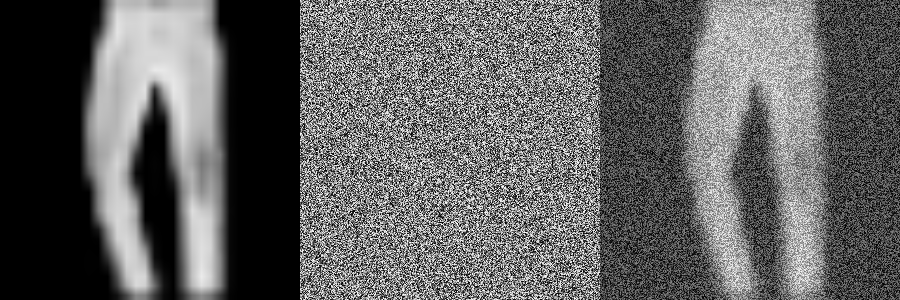

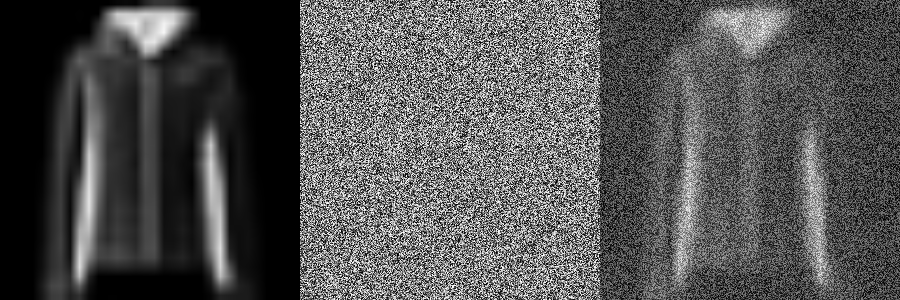

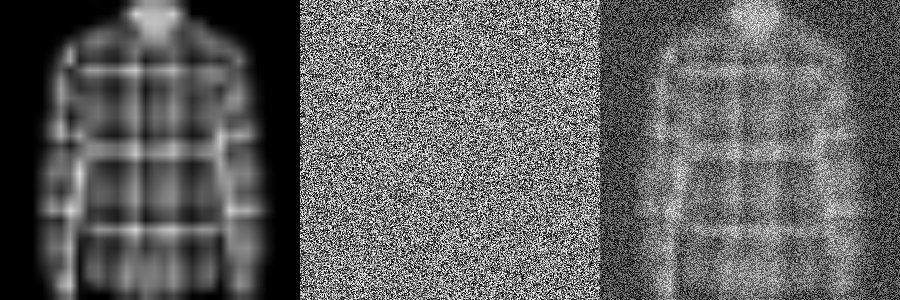

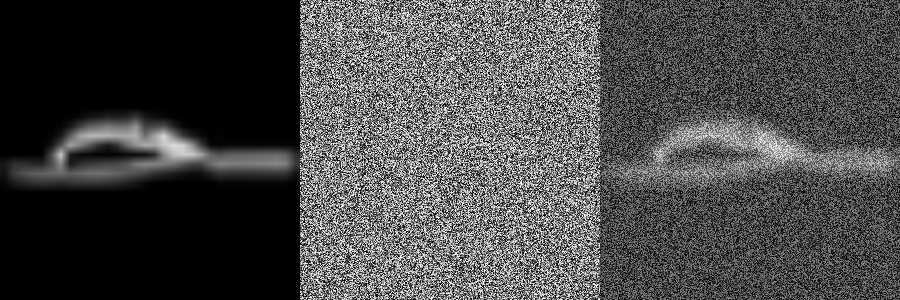

In [ ]:
# Добавление равномерного шума
for i in range(9):
  cv2_imshow(np.concatenate((
             cv2.resize(x_test[i], (300, 300)), 
             get_uniform_noise(cv2.resize(x_test[i], (300, 300))), 
             set_uniform_noise(cv2.resize(x_test[i], (300, 300)))), axis=1))